<a href="https://www.kaggle.com/code/jovanchua/human-emotions-efficientnetb0?scriptVersionId=138699188" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/human-face-emotions/data/Angry/1564075.jpg
/kaggle/input/human-face-emotions/data/Angry/118-1183847_angry-person-png-picture.png
/kaggle/input/human-face-emotions/data/Angry/flat-of-two-angry-people-vector-18548440.jpg
/kaggle/input/human-face-emotions/data/Angry/getty_465251909_970647970450036_71256.jpg
/kaggle/input/human-face-emotions/data/Angry/shutterstock_80776702_0.jpg
/kaggle/input/human-face-emotions/data/Angry/Angry-Person-PNG-Transparent-Image.png
/kaggle/input/human-face-emotions/data/Angry/Angry-People.jpg
/kaggle/input/human-face-emotions/data/Angry/60552212-angry-people-illustration-design-collection.jpg
/kaggle/input/human-face-emotions/data/Angry/angry-person-png-free-image-angry-kid-png-transparent-115629678417zic9bd9z6.png
/kaggle/input/human-face-emotions/data/Angry/40-bigstock-Mad-fight-of-business-people-61801940.jpg
/kaggle/input/human-face-emotions/data/Angry/Angry-Person-PNG-Pic.png
/kaggle/input/human-face-emotions/data/Angry/deal-with-angry-pers

# Import libraries and data

## Libraries

In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
import shutil
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
from PIL import Image

%matplotlib inline
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data

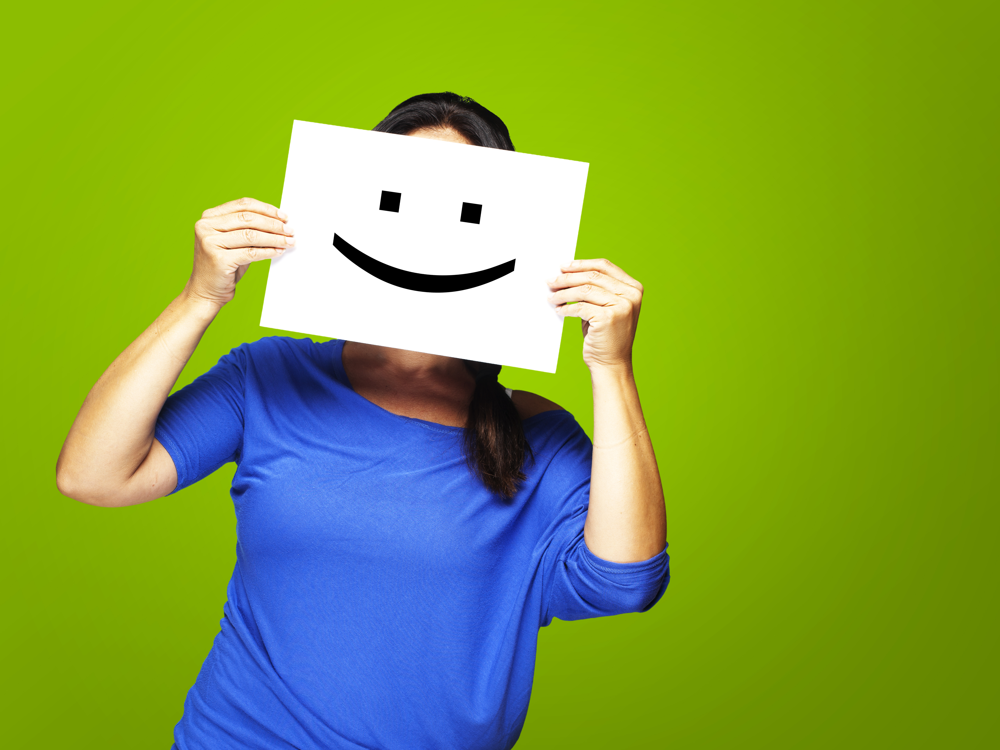

In [3]:
random_path = '/kaggle/input/human-face-emotions/data/Happy/smile.woman_.jpg'
Image.open(random_path)

It seems that the data are all in image format and thus we can't directly store it in a dataframe, we can however form a dataframe with its path and target label.

In [4]:
PATH = '/kaggle/input/human-face-emotions/data'

img_dir = Path(PATH)
files = list(img_dir.glob('**/*.jpg')) 

In [5]:
# For illustration purpose
print(os.path.split(files[0]))
print(os.path.split(files[0])[0])
print(os.path.split(files[0])[0].split('/')[-1])

label = list(map(lambda x: os.path.split(x)[0].split('/')[-1], files))

('/kaggle/input/human-face-emotions/data/Angry', '1564075.jpg')
/kaggle/input/human-face-emotions/data/Angry
Angry


In [6]:
paths = pd.Series(files,name='Path').astype(str)
labels = pd.Series(label,name='Label')
df = pd.concat([paths,labels],axis=1)

display(df.head())
display(df.tail())
display(df.shape)

,Path,Label
0,/kaggle/input/human-face-emotions/data/Angry/1...,Angry
1,/kaggle/input/human-face-emotions/data/Angry/f...,Angry
2,/kaggle/input/human-face-emotions/data/Angry/g...,Angry
3,/kaggle/input/human-face-emotions/data/Angry/s...,Angry
4,/kaggle/input/human-face-emotions/data/Angry/A...,Angry


,Path,Label
211,/kaggle/input/human-face-emotions/data/Happy/h...,Happy
212,/kaggle/input/human-face-emotions/data/Happy/h...,Happy
213,/kaggle/input/human-face-emotions/data/Happy/i...,Happy
214,/kaggle/input/human-face-emotions/data/Happy/p...,Happy
215,/kaggle/input/human-face-emotions/data/Happy/s...,Happy


(216, 2)

### Splitting into train and test/validation sets

In [7]:
from sklearn.model_selection import train_test_split
X_tr, X_val, y_tr, y_val = train_test_split(df.Path, df.Label, test_size = 0.2, shuffle = True, random_state = 42)
display(X_tr)
display(y_tr)

84     /kaggle/input/human-face-emotions/data/Sad/sad...
95     /kaggle/input/human-face-emotions/data/Sad/737...
137    /kaggle/input/human-face-emotions/data/Happy/f...
211    /kaggle/input/human-face-emotions/data/Happy/h...
86     /kaggle/input/human-face-emotions/data/Sad/dep...
                             ...                        
106    /kaggle/input/human-face-emotions/data/Sad/sad...
14     /kaggle/input/human-face-emotions/data/Angry/t...
92     /kaggle/input/human-face-emotions/data/Sad/dep...
179    /kaggle/input/human-face-emotions/data/Happy/H...
102    /kaggle/input/human-face-emotions/data/Sad/360...
Name: Path, Length: 172, dtype: object

84       Sad
95       Sad
137    Happy
211    Happy
86       Sad
       ...  
106      Sad
14     Angry
92       Sad
179    Happy
102      Sad
Name: Label, Length: 172, dtype: object

# EDA

In [8]:
df.Label.value_counts()

Happy    80
Sad      69
Angry    67
Name: Label, dtype: int64

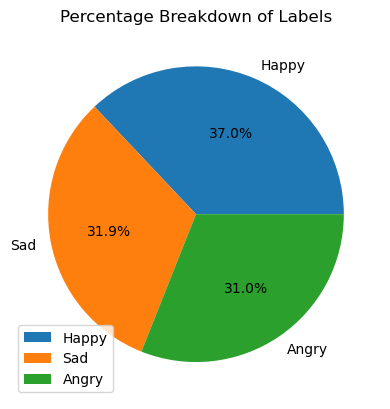

In [9]:
plt.pie(df.Label.value_counts().values, labels=df.Label.value_counts().index, autopct='%1.1f%%')
plt.legend(loc = 'lower left')
plt.title('Percentage Breakdown of Labels')
plt.show();

It is fairly distributed.

In [10]:
# a random example
import random
random_paths = X_tr.sample(10)
random_img = [plt.imread(x) for x in random_paths]
random_img_dim = [x.shape for x in random_img]
random_img_dim

[(800, 1528, 3),
 (600, 1200, 3),
 (427, 640, 3),
 (387, 900, 3),
 (1667, 2500, 3),
 (417, 626, 3),
 (630, 1200, 3),
 (176, 286, 3),
 (1300, 1300, 3),
 (1080, 1920, 3)]

The photos all come in different W x H dimensions, but color channels = 3 is consistent, we have to standardize the size further down the pipeline.

# TensorFlow

## Preparing the data

In [11]:
class_names = np.array(sorted([item.name for item in img_dir.glob('*')])) 
class_names

array(['Angry', 'Happy', 'Sad'], dtype='<U5')

In [12]:
tr, val = pd.concat([X_tr, y_tr], axis = 1).reset_index(drop = True), pd.concat([X_val, y_val], axis = 1).reset_index(drop = True)
display(tr.head())
display(val.head())

,Path,Label
0,/kaggle/input/human-face-emotions/data/Sad/sad...,Sad
1,/kaggle/input/human-face-emotions/data/Sad/737...,Sad
2,/kaggle/input/human-face-emotions/data/Happy/f...,Happy
3,/kaggle/input/human-face-emotions/data/Happy/h...,Happy
4,/kaggle/input/human-face-emotions/data/Sad/dep...,Sad


,Path,Label
0,/kaggle/input/human-face-emotions/data/Happy/h...,Happy
1,/kaggle/input/human-face-emotions/data/Happy/i...,Happy
2,/kaggle/input/human-face-emotions/data/Happy/4...,Happy
3,/kaggle/input/human-face-emotions/data/Happy/g...,Happy
4,/kaggle/input/human-face-emotions/data/Angry/a...,Angry


In [13]:
import tensorflow as tf
from tensorflow.keras import layers
from keras.preprocessing.image import ImageDataGenerator

# data augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                            rotation_range=0,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip = True,
                            vertical_flip = True)

val_datagen = ImageDataGenerator(rescale = 1./255) #rescaling would do 

train_data = train_datagen.flow_from_dataframe(dataframe = tr,
                                               x_col = 'Path',
                                               y_col = 'Label',
                                               batch_size = 32,
                                               target_size = (224, 224),
                                               shuffle = True,
                                               seed = 42,
                                               class_mode = 'categorical')

val_data = val_datagen.flow_from_dataframe(dataframe = val,
                                           x_col = 'Path',
                                           y_col = 'Label',
                                           batch_size = 32,
                                           target_size = (224, 224),
                                           shuffle = True,
                                           seed = 42,
                                           class_mode = 'categorical')

Found 172 validated image filenames belonging to 3 classes.
Found 44 validated image filenames belonging to 3 classes.


Perfect, we have sucessfully loaded in our images into tensorflow dataloaders which will allow for batching and fetching -> leading to more efficient workflows and pipelines.

## Basic model

In [14]:
inputs = layers.Input(shape = (224, 224, 3), name = 'input_layer')
x = layers.Conv2D(filters = 5, kernel_size = 3, activation = 'relu')(inputs)
x = layers.Conv2D(filters = 5, kernel_size = 3, activation = 'relu')(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(filters = 5, kernel_size = 3, activation = 'relu')(x)
x = layers.Conv2D(filters = 5, kernel_size = 3, activation = 'relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation = 'relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(3, activation = 'softmax')(x)
model_1 = tf.keras.Model(inputs, outputs)

model_1.compile(loss = 'categorical_crossentropy',
               optimizer = tf.keras.optimizers.Adam(),
               metrics = ['accuracy'])

ckpt_path = 'model_checkpoints'
ckpt = tf.keras.callbacks.ModelCheckpoint(ckpt_path, save_best_only = True, save_weights_only = True)

In [15]:
history_1 = model_1.fit(train_data,
                        epochs = 5,
                        validation_data = val_data,
                        callbacks = [ckpt]
                        )

Epoch 1/5
6/6 [==============================] - 19s 2s/step - loss: 1.2710 - accuracy: 0.3605 - val_loss: 1.1039 - val_accuracy: 0.3636
Epoch 2/5
6/6 [==============================] - 6s 976ms/step - loss: 1.1258 - accuracy: 0.3547 - val_loss: 1.1204 - val_accuracy: 0.3409
Epoch 3/5
6/6 [==============================] - 6s 1s/step - loss: 1.0837 - accuracy: 0.4012 - val_loss: 1.1530 - val_accuracy: 0.3182
Epoch 4/5
6/6 [==============================] - 6s 1s/step - loss: 1.0890 - accuracy: 0.4302 - val_loss: 1.1480 - val_accuracy: 0.3864
Epoch 5/5
6/6 [==============================] - 6s 1s/step - loss: 1.0793 - accuracy: 0.4070 - val_loss: 1.1505 - val_accuracy: 0.4318


## Transfer learning with ResNetB0

For EfficientNet architecture, image rescaling has already been built in, we opt to remove it in our ImageDataGenerator process.

In [16]:
# data augmentation
train_datagen = ImageDataGenerator(#rescale = 1./255,
                            rotation_range=0,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip = True,
                            vertical_flip = True)

val_datagen = ImageDataGenerator()

train_data = train_datagen.flow_from_dataframe(dataframe = tr,
                                               x_col = 'Path',
                                               y_col = 'Label',
                                               batch_size = 32,
                                               target_size = (224, 224),
                                               shuffle = True,
                                               seed = 42,
                                               class_mode = 'categorical')

val_data = val_datagen.flow_from_dataframe(dataframe = val,
                                           x_col = 'Path',
                                           y_col = 'Label',
                                           batch_size = 32,
                                           target_size = (224, 224),
                                           shuffle = True,
                                           seed = 42,
                                           class_mode = 'categorical')

Found 172 validated image filenames belonging to 3 classes.
Found 44 validated image filenames belonging to 3 classes.


In [17]:
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top=False)

16705208/16705208 [==============================] - 0s 0us/step


In [18]:
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [19]:
inputs = layers.Input(shape = (224, 224, 3))
x = base_model(inputs, training = False) 
x = layers.GlobalMaxPooling2D(name="global_average_pooling")(x) 
outputs = layers.Dense(3, activation="softmax")(x)
model_2 = tf.keras.Model(inputs, outputs)

model_2.compile(loss = 'categorical_crossentropy',
               optimizer = tf.keras.optimizers.Adam(),
               metrics = ['accuracy'])

In [20]:
history_2 = model_2.fit(train_data,
                       epochs = 10,
                       validation_data = val_data,
                       callbacks = [ckpt])

Epoch 1/10
6/6 [==============================] - 17s 1s/step - loss: 4.2864 - accuracy: 0.3663 - val_loss: 3.1500 - val_accuracy: 0.5682
Epoch 2/10
6/6 [==============================] - 6s 1s/step - loss: 1.6424 - accuracy: 0.6860 - val_loss: 1.6676 - val_accuracy: 0.6364
Epoch 3/10
6/6 [==============================] - 6s 916ms/step - loss: 0.9935 - accuracy: 0.7674 - val_loss: 2.0605 - val_accuracy: 0.6136
Epoch 4/10
6/6 [==============================] - 6s 982ms/step - loss: 0.4987 - accuracy: 0.8372 - val_loss: 1.1892 - val_accuracy: 0.7045
Epoch 5/10
6/6 [==============================] - 6s 1s/step - loss: 0.4886 - accuracy: 0.8837 - val_loss: 1.5900 - val_accuracy: 0.6136
Epoch 6/10
6/6 [==============================] - 7s 1s/step - loss: 0.3439 - accuracy: 0.8895 - val_loss: 1.0913 - val_accuracy: 0.7500
Epoch 7/10
6/6 [==============================] - 6s 1s/step - loss: 0.2471 - accuracy: 0.9186 - val_loss: 1.0963 - val_accuracy: 0.7500
Epoch 8/10
6/6 [==================

In [21]:
model_2.load_weights('model_checkpoints')

In [22]:
!wget https://www.allprodad.com/wp-content/uploads/2021/03/05-12-21-happy-people.jpg

--2023-08-02 14:53:01--  https://www.allprodad.com/wp-content/uploads/2021/03/05-12-21-happy-people.jpg
Resolving www.allprodad.com (www.allprodad.com)... 104.26.8.139, 104.26.9.139, 172.67.71.3, ...
Connecting to www.allprodad.com (www.allprodad.com)|104.26.8.139|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 97317 (95K) [image/jpeg]
Saving to: ‘05-12-21-happy-people.jpg’

05-12-21-happy-peop 100%[===================>]  95.04K  --.-KB/s    in 0.01s   

2023-08-02 14:53:01 (6.62 MB/s) - ‘05-12-21-happy-people.jpg’ saved [97317/97317]



In [23]:
def load_and_prep_image(filename, img_shape=224):
    img = tf.io.read_file(filename)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, size = [img_shape, img_shape])
    return img

In [24]:
test_photo_path = '/kaggle/working/05-12-21-happy-people.jpg'
test_photo = load_and_prep_image(test_photo_path)
test_photo.shape

TensorShape([224, 224, 3])

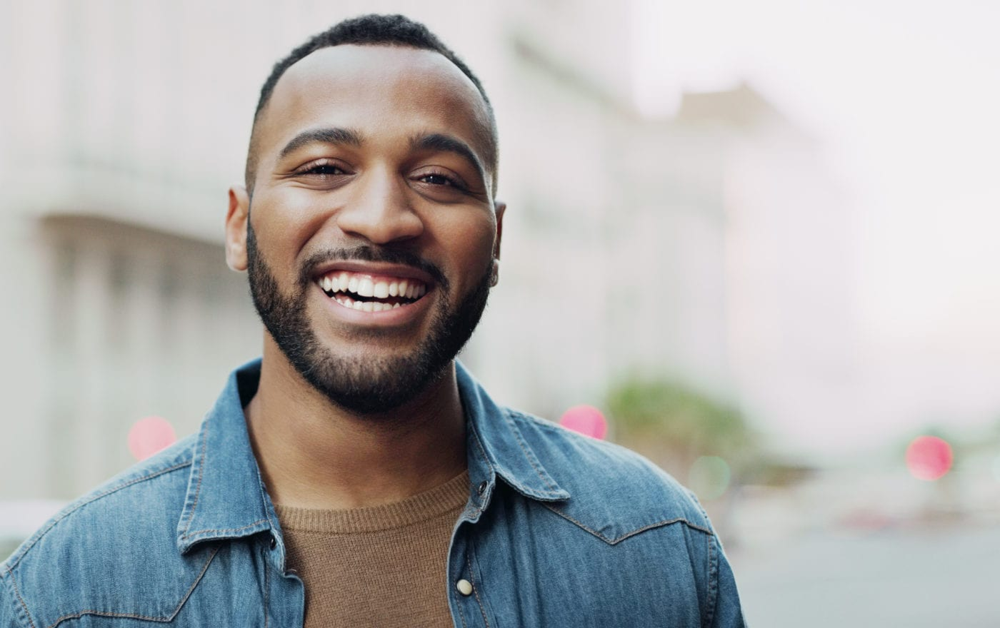

In [25]:
Image.open(test_photo_path)

This is one happy man.

In [26]:
class_names[tf.argmax(model_2.predict(tf.expand_dims(test_photo, 0)), axis = 1)]

1/1 [==============================] - 2s 2s/step


array(['Happy'], dtype='<U5')

Our prediction is correct!

# Pytorch (HuggingFace) WIP

In [27]:
### TBD ###